     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 160.4/160.4 kB 2.4 MB/s eta 0:00:00


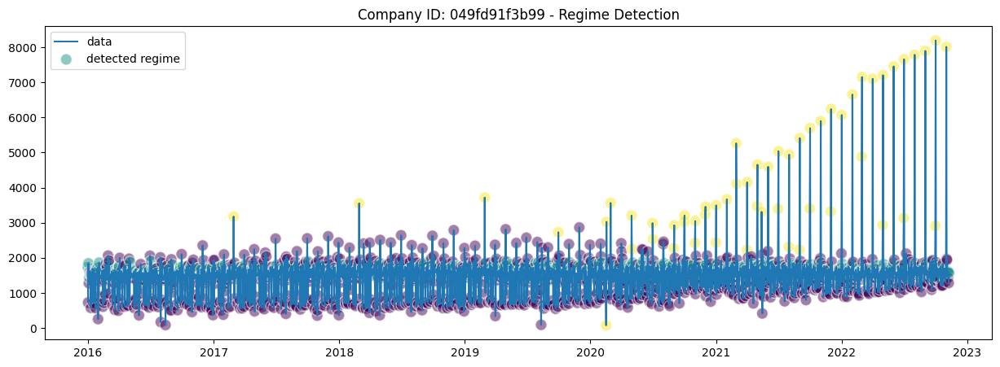

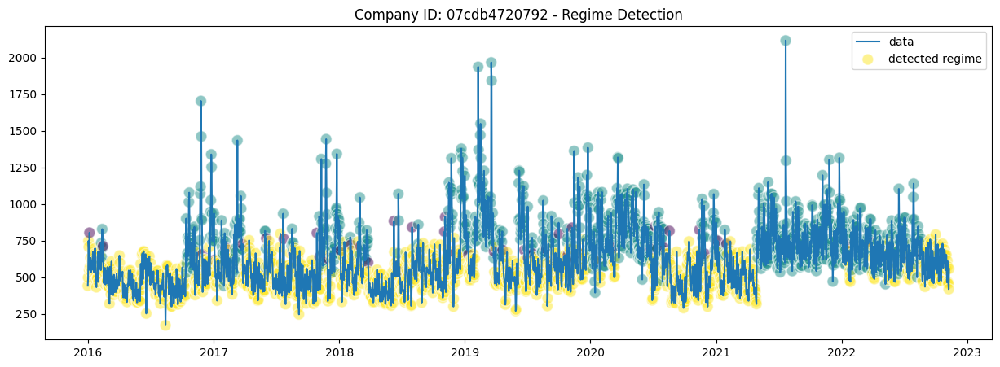

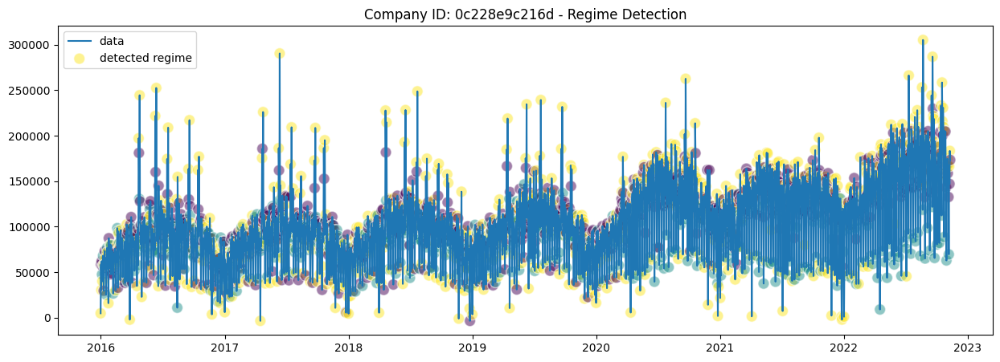

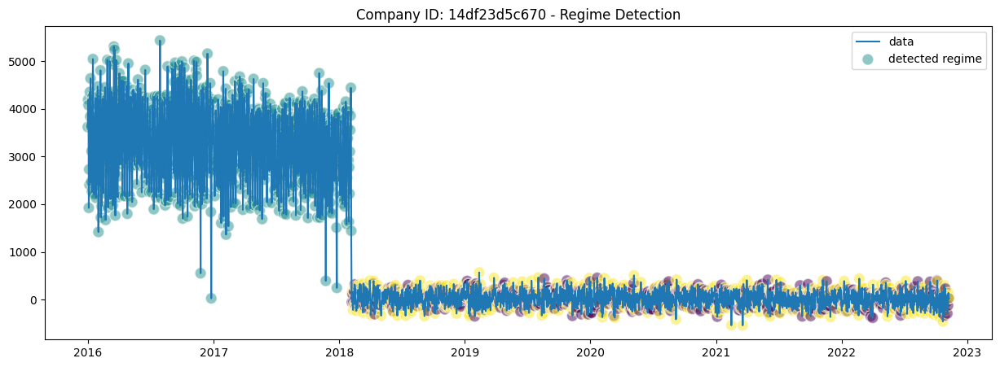

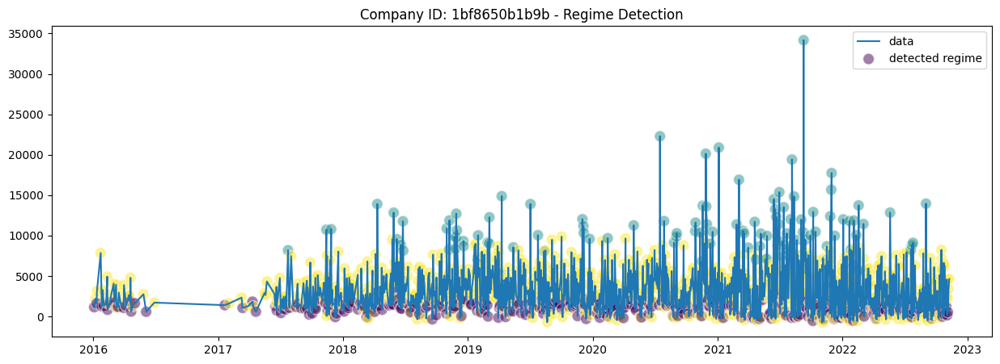

...

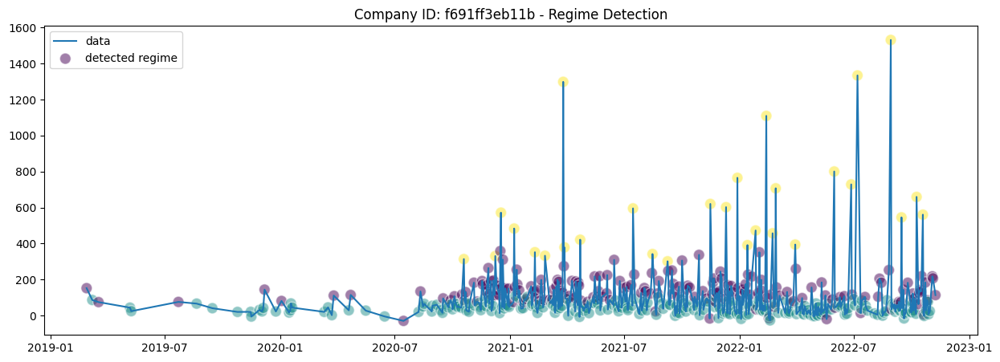

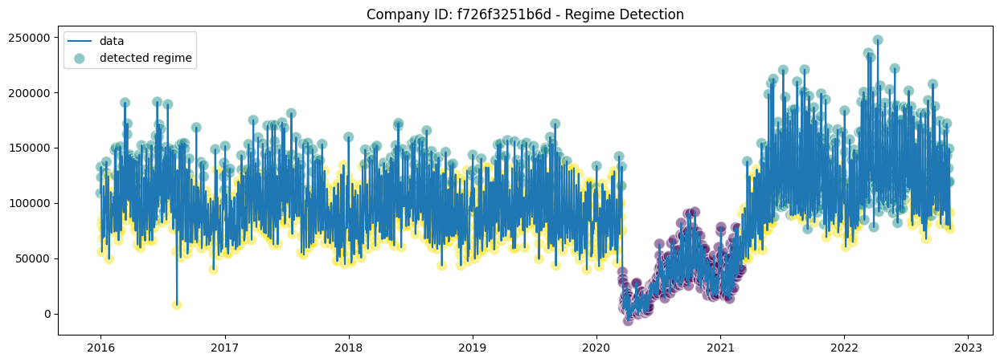

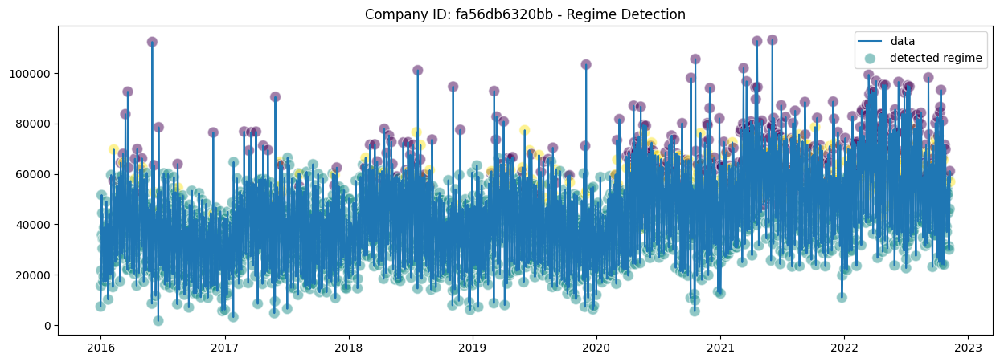

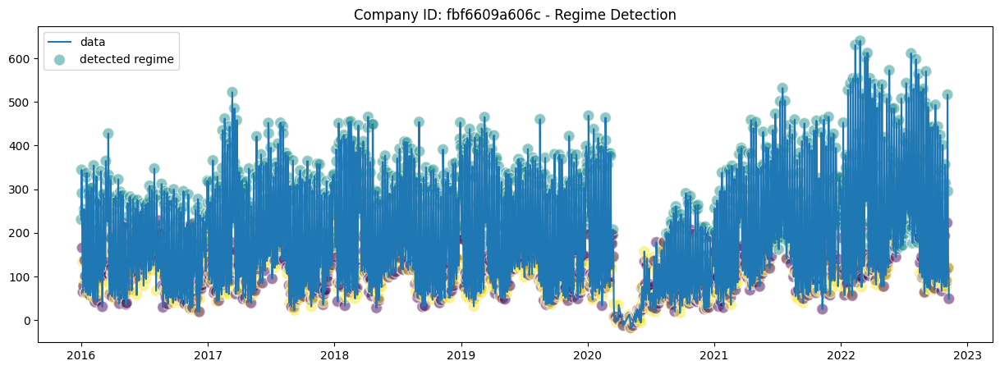

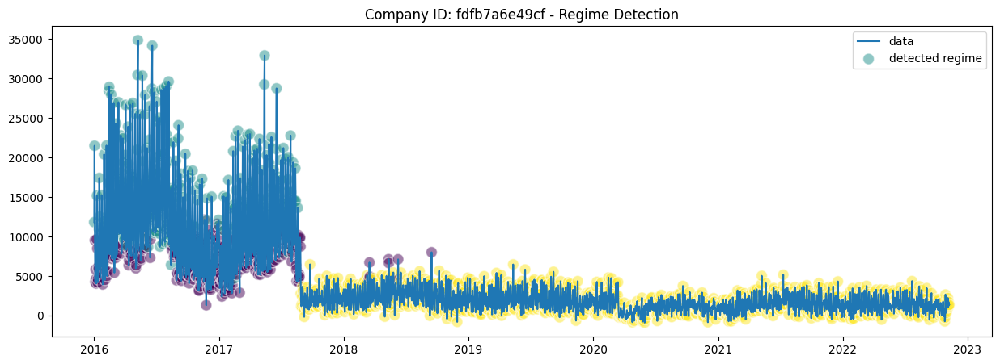

In [2]:
# Required Libraries in Alphabetical Order

!pip install hmmlearn

import matplotlib.pyplot as plt
import pandas as pd

from hmmlearn import hmm

class RegimeDetector:
    def __init__(self, data_path):
        """
        Initialize the RegimeDetector with the path to the data.
        Load and sort the data.
        """
        # Load and preprocess the data
        self.df = pd.read_csv(data_path, parse_dates=['trans_date'])
        self.df.sort_values(by=['Unnamed: 0', 'trans_date'], inplace=True)
        # Extract unique company IDs
        self.company_ids = self.df['Unnamed: 0'].unique()

    def detect_and_plot_regimes(self, n_components=3):
        """
        Detects and plots regimes for each company.
        Uses GaussianHMM to detect regimes and then visualizes the results.
        n_components defines the number of states for the HMM model.
        """
        for company_id in self.company_ids:
            # Subset the DataFrame for each company
            df_company = self.df[self.df['Unnamed: 0'] == company_id]

            # Train the HMM on the entire company data for regime detection
            model = hmm.GaussianHMM(n_components=n_components, covariance_type="full")
            model.fit(df_company['data'].values.reshape(-1, 1))

            # Predict regimes
            regimes = model.predict(df_company['data'].values.reshape(-1, 1))

            # Plot the data
            plt.figure(figsize=(15, 5))
            plt.title(f'Company ID: {company_id} - Regime Detection')
            plt.plot(df_company['trans_date'], df_company['data'], label='data')

            # Overlay the detected regimes
            plt.scatter(df_company['trans_date'], df_company['data'], c=regimes, cmap='viridis',
                        label='detected regime', alpha=0.5, edgecolors='w', s=100)

            plt.legend()
            plt.show()

# Note: To load the data, either specify the local path or include the path where it's stored.

data_path = 'data4columbia_credit.csv'
rd = RegimeDetector(data_path)
rd.detect_and_plot_regimes()